In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

# Basic Imports

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sys import getsizeof
from fsl_experiment_suite import Path

In [3]:
from fsl_experiment_suite.data.utils import load_evs, EXPERIMENTS
from fsl_experiment_suite.data.core import get_events

In [4]:
import nilearn
import nibabel as nib
from nilearn import plotting, image, masking, datasets, input_data
from nilearn.plotting import plot_anat, plot_img, plot_stat_map, plot_prob_atlas

/home/anukoolpurohit/anaconda3/envs/FSL/lib/python3.9/site-packages/nilearn/datasets/__init__.py:86: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  warn("Fetchers from the nilearn.datasets module will be "


# Getting the data

In [5]:
DATA_DIR = Path("/home/anukoolpurohit/Documents/AnukoolPurohit/Datasets/fslcourse/fslcourse_data")

In [6]:
experiment = "parametric"
parametric_stimulus_data = load_evs(experiment)
TR = EXPERIMENTS[experiment]['TR']

In [7]:
parametric_fmri_img = nib.load(DATA_DIR/"parametric"/"fmri_data.nii.gz")
parametric_fmri_img.uncache()

In [8]:
print(f"The orignal fmri is of size: {parametric_fmri_img.shape}")

The orignal fmri is of size: (91, 109, 91, 1100)


# Encoding

## Remove Background
Since this is a standard [MNI Brain](https://brainmap.org/training/BrettTransform.html) we will use the standard MNI background to mask out the brain.

In [9]:
# Generating MNI background mask for the orignal FMRI
MNI_background_mask = masking.compute_brain_mask(parametric_fmri_img)
parametric_fmri_img.uncache()

In [10]:
# Extracting voxels using the mask
parametric_fmri_without_background = masking.apply_mask(parametric_fmri_img,
                                                        MNI_background_mask)
parametric_fmri_img.uncache()

In [11]:
print(f"The shape of extracted voxels is {parametric_fmri_without_background.shape} time x voxels")

The shape of extracted voxels is (1100, 229007) time x voxels


## Hemodynamic Response Function

In [12]:
from nilearn.glm.first_level.hemodynamic_models import _gamma_difference_hrf

In [13]:
tr=TR 
time_length=20
oversampling=1
onset=0
HRF = _gamma_difference_hrf(tr, oversampling, time_length, onset,
                                 delay=4, undershoot=12., dispersion=.9,
                                 u_dispersion=.9, ratio=.35)

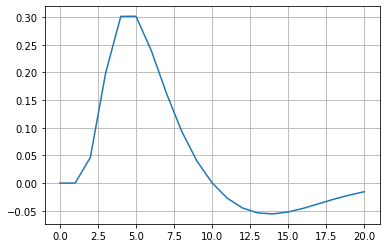

In [14]:
plt.plot(HRF)
plt.grid()
plt.savefig('images/hrf.png')
plt.show()

In [15]:
n   = len(parametric_stimulus_data['WPM_0050'])
data_wpm_0050 = np.convolve(parametric_stimulus_data['WPM_0050'],HRF,'full')[:n]
data_wpm_0350 = np.convolve(parametric_stimulus_data['WPM_0350'],HRF,'full')[:n]
data_wpm_0650 = np.convolve(parametric_stimulus_data['WPM_0650'],HRF,'full')[:n]
data_wpm_0950 = np.convolve(parametric_stimulus_data['WPM_0950'],HRF,'full')[:n]
data_wpm_1250 = np.convolve(parametric_stimulus_data['WPM_1250'],HRF,'full')[:n]

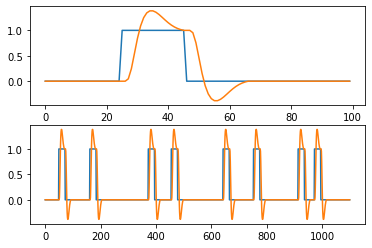

In [16]:
fig, a = plt.subplots(2, 1)
a[0].plot(parametric_stimulus_data['WPM_0050'][:100])
a[0].plot(data_wpm_0050[:100])

a[1].plot(parametric_stimulus_data['WPM_0350'])
a[1].plot(data_wpm_0350)
plt.savefig('images/HRF_on_stimulus.png')
plt.show()

## Design Matrix

In [17]:
data_wpm = [data_wpm_0050, data_wpm_0350, data_wpm_0650, data_wpm_0950, data_wpm_1250]
mean_subtracted_data = [dt - np.mean(dt) for dt in data_wpm]
design_matrix = np.asarray(mean_subtracted_data +[np.ones_like(mean_subtracted_data[0])]).T

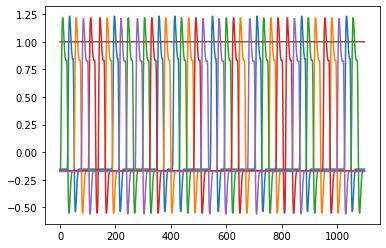

In [18]:
plt.plot(design_matrix)
plt.savefig('images/design_matrix.png')
plt.show()

## GLM

In [19]:
from fsl_experiment_suite.glm import glm

In [20]:
mask_glm = np.ones_like(parametric_fmri_without_background[0])>0
beta, t_stats = glm(Y=parametric_fmri_without_background, X=design_matrix, mask = mask_glm)
t_stats_fmri = masking.unmask(t_stats, MNI_background_mask)
beta_fmri = masking.unmask(beta, MNI_background_mask)

/home/anukoolpurohit/Documents/Workspace/Nueromatch/FSLexperiments/fsl_experiment_suite/glm.py:41: RuntimeWarning: invalid value encountered in true_divide
  tstat[:,mask] = cope[:,mask] / np.sqrt(varcope[:,mask])


## Plot T-stats

In [21]:
vwfa_coords = (-46, -60, 18)

/home/anukoolpurohit/anaconda3/envs/FSL/lib/python3.9/site-packages/nilearn/_utils/niimg.py:61: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(


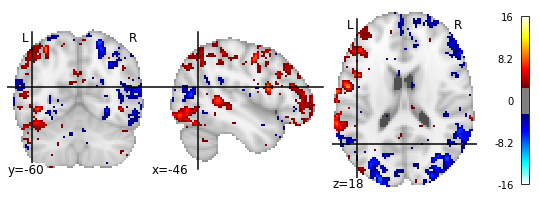

In [22]:
plot_stat_map(image.index_img(t_stats_fmri, 0), threshold=2.5, cut_coords=vwfa_coords)


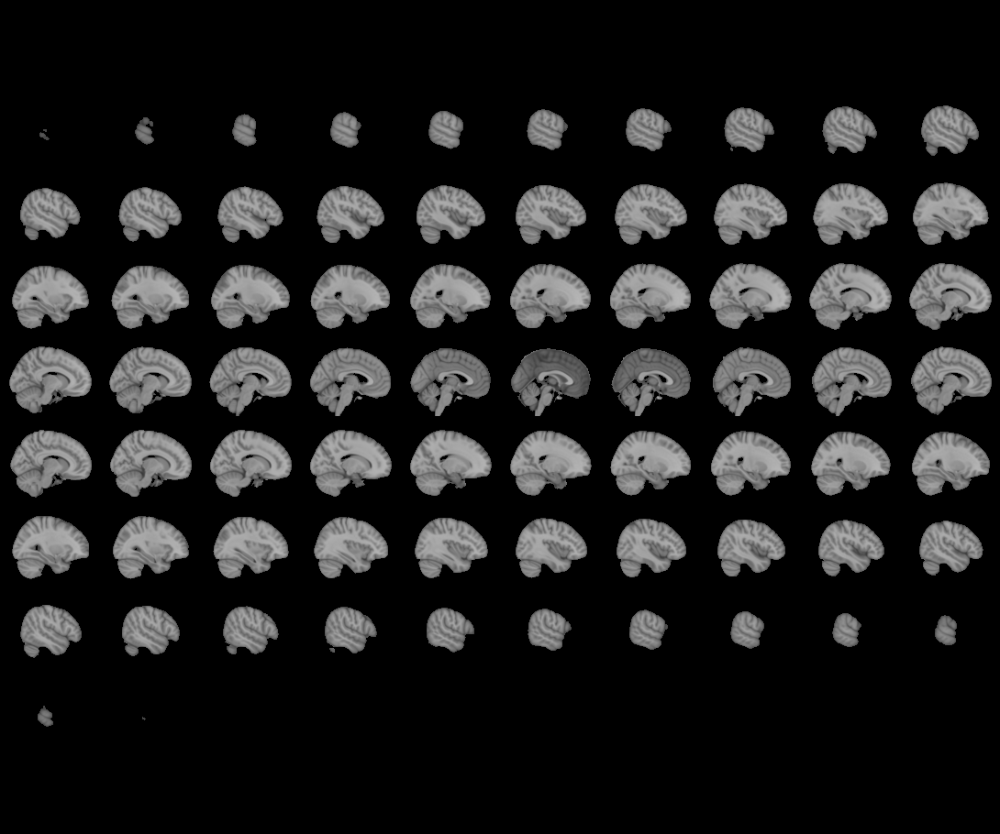
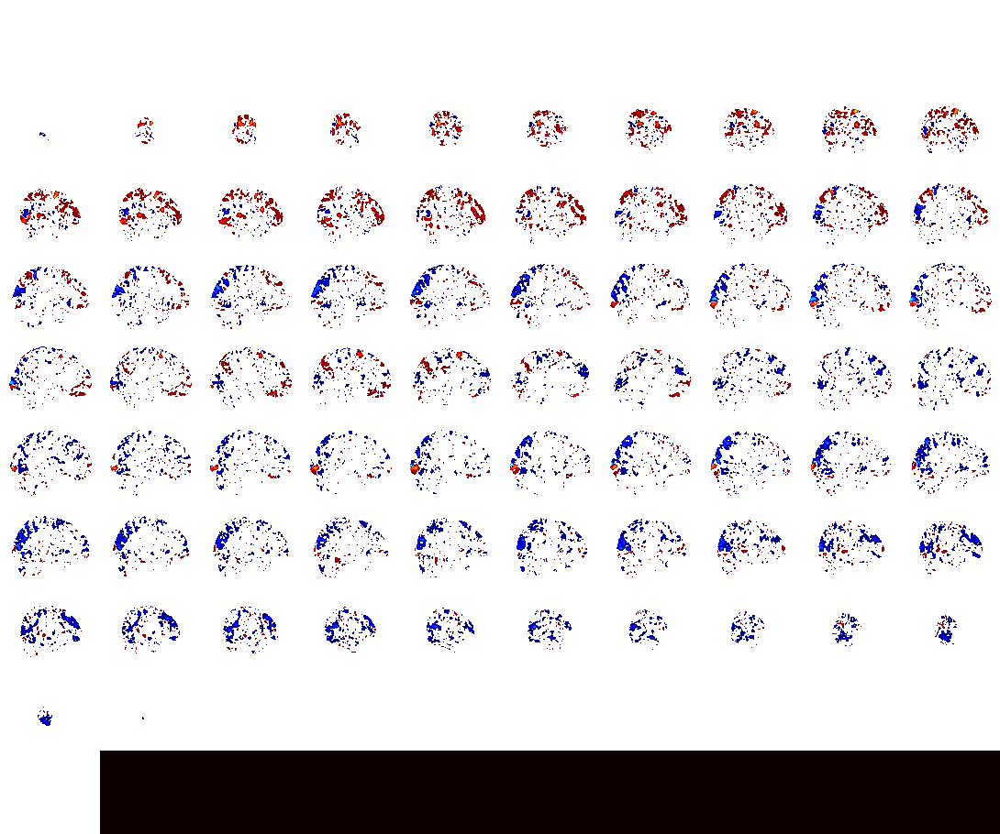

In [23]:
# 50 WPM
plotting.view_img(image.index_img(t_stats_fmri, 0), threshold=2.0)

/home/anukoolpurohit/anaconda3/envs/FSL/lib/python3.9/site-packages/nilearn/_utils/niimg.py:61: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(


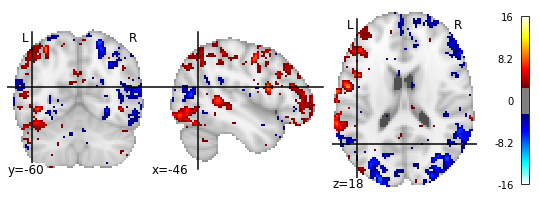

In [24]:
plot_stat_map(image.index_img(t_stats_fmri, 0), threshold=2.5, cut_coords=vwfa_coords)


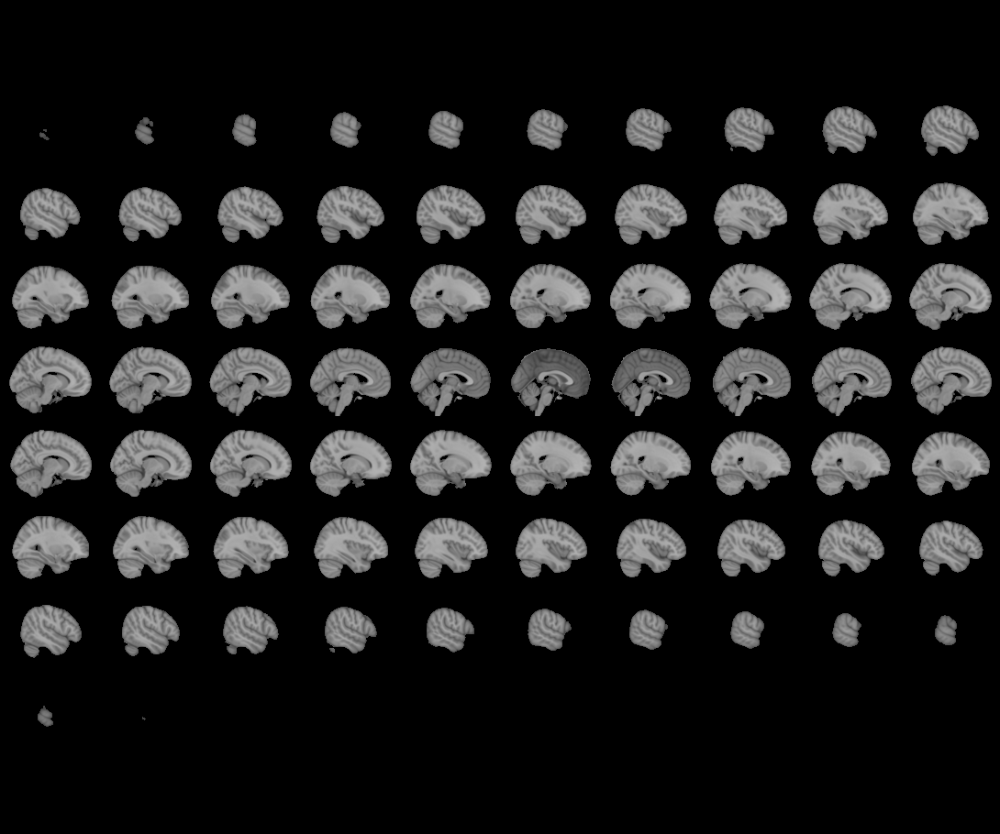
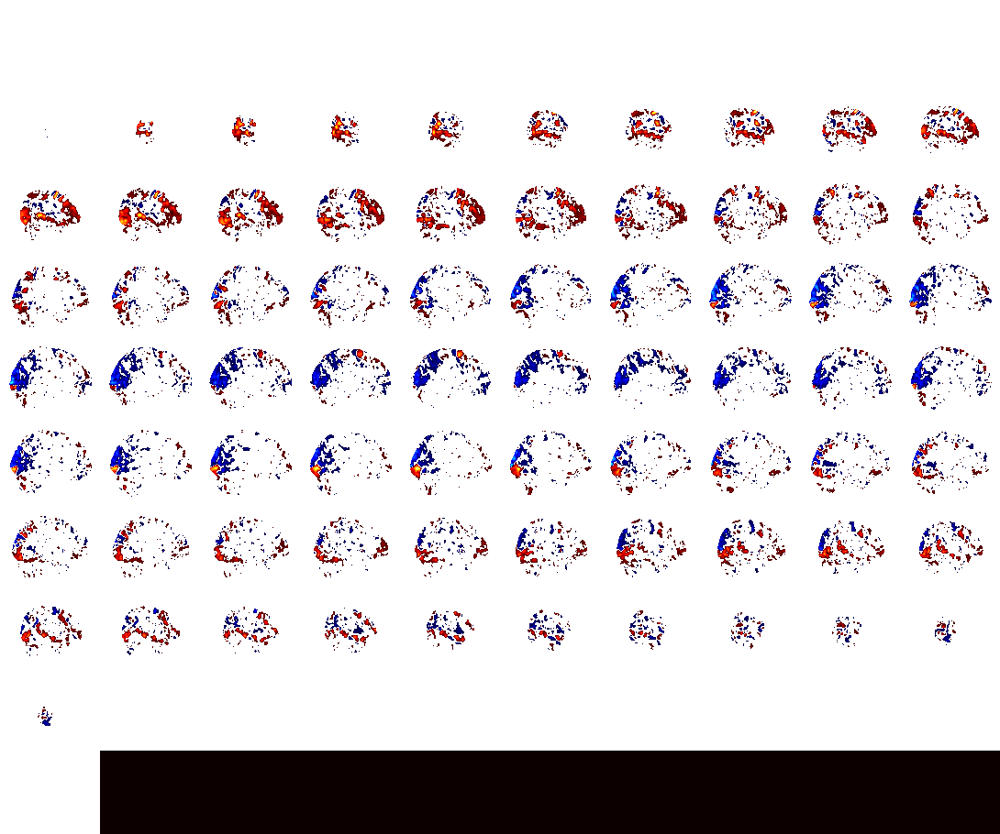

In [25]:
# 350 WPM
plotting.view_img(image.index_img(t_stats_fmri, 1), threshold=2.5)

/home/anukoolpurohit/anaconda3/envs/FSL/lib/python3.9/site-packages/nilearn/_utils/niimg.py:61: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(


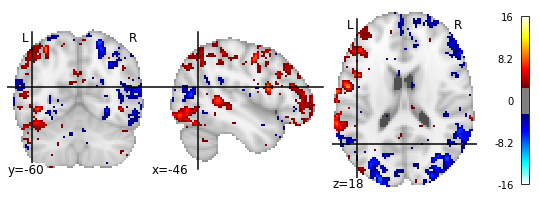

In [26]:
plot_stat_map(image.index_img(t_stats_fmri, 0), threshold=2.5, cut_coords=vwfa_coords)


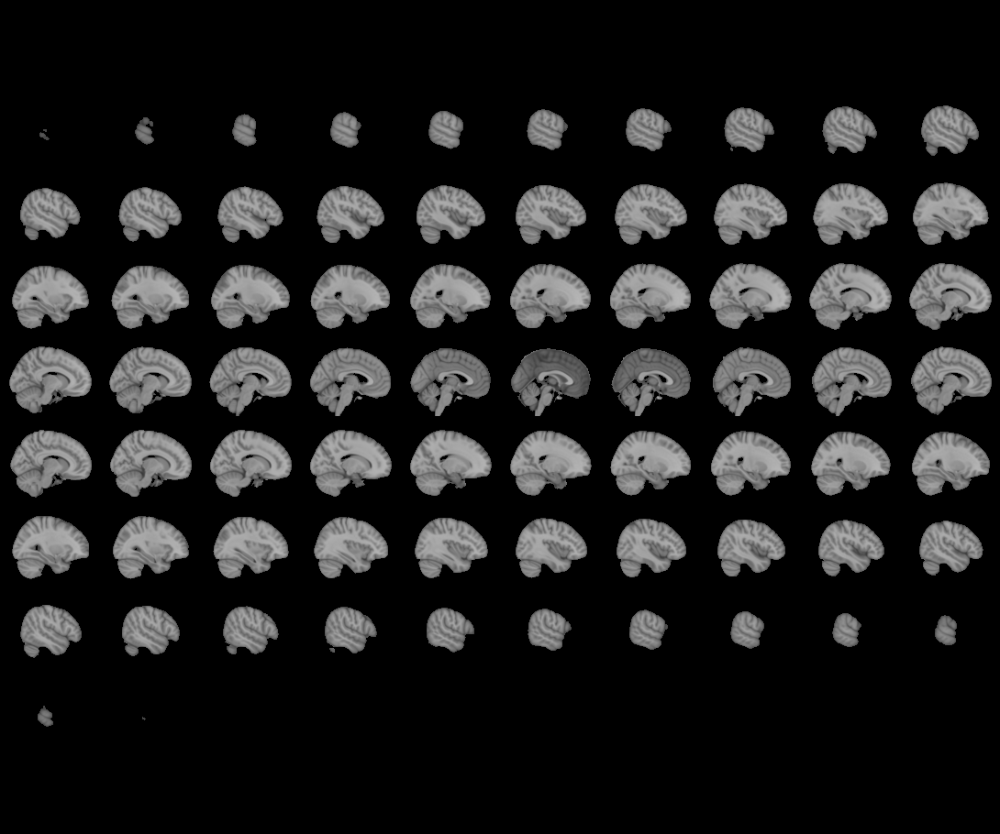
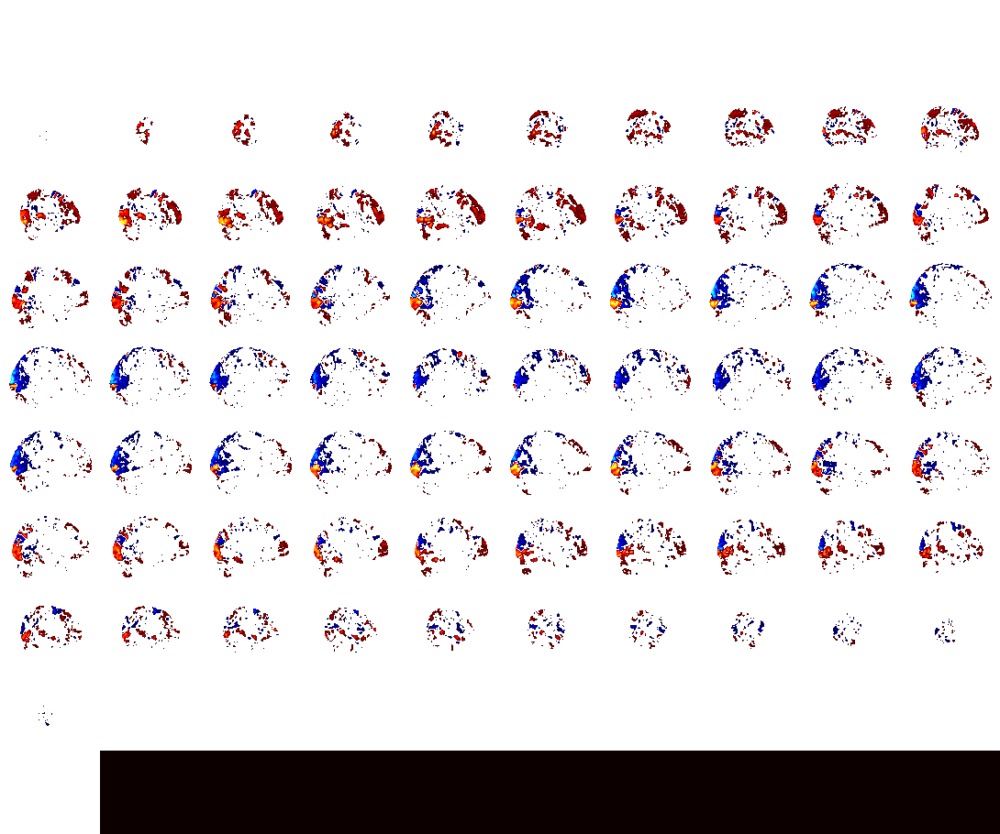

In [27]:
# 650 WPM
plotting.view_img(image.index_img(t_stats_fmri, 2), threshold=2.5)

/home/anukoolpurohit/anaconda3/envs/FSL/lib/python3.9/site-packages/nilearn/_utils/niimg.py:61: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(


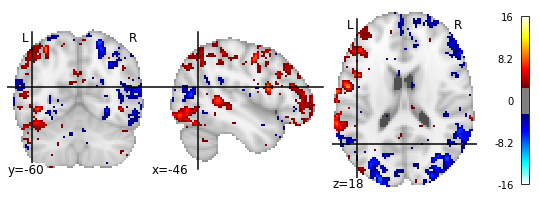

In [28]:
plot_stat_map(image.index_img(t_stats_fmri, 0), threshold=2.5, cut_coords=vwfa_coords)


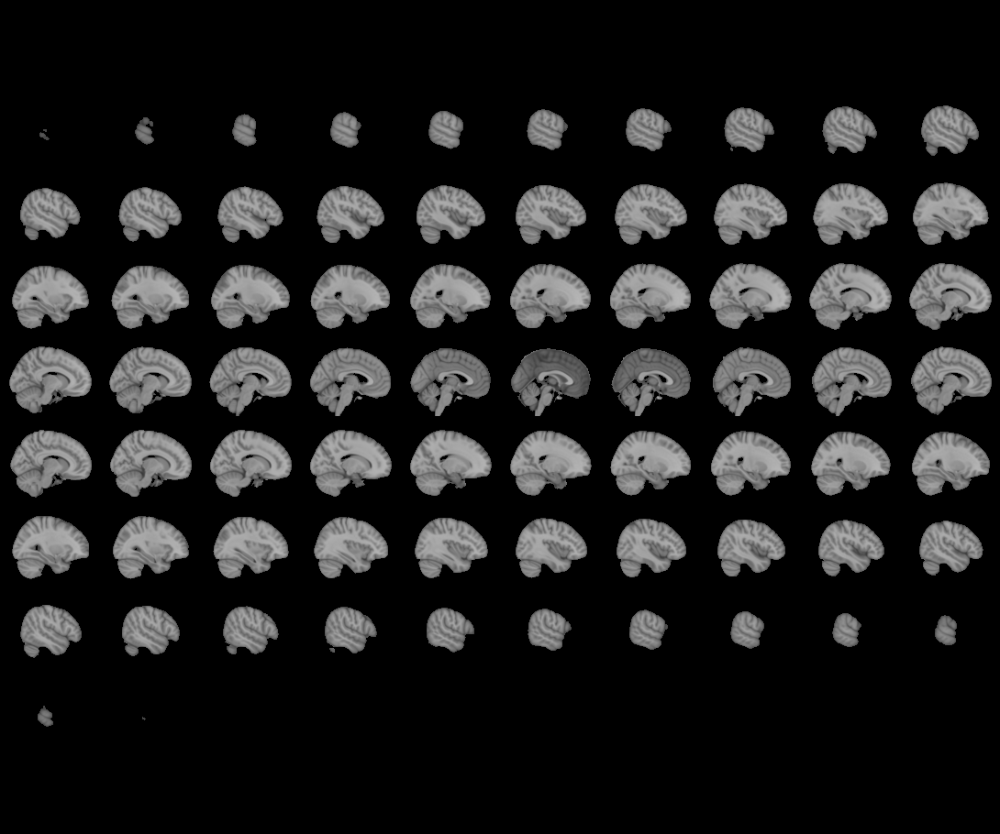
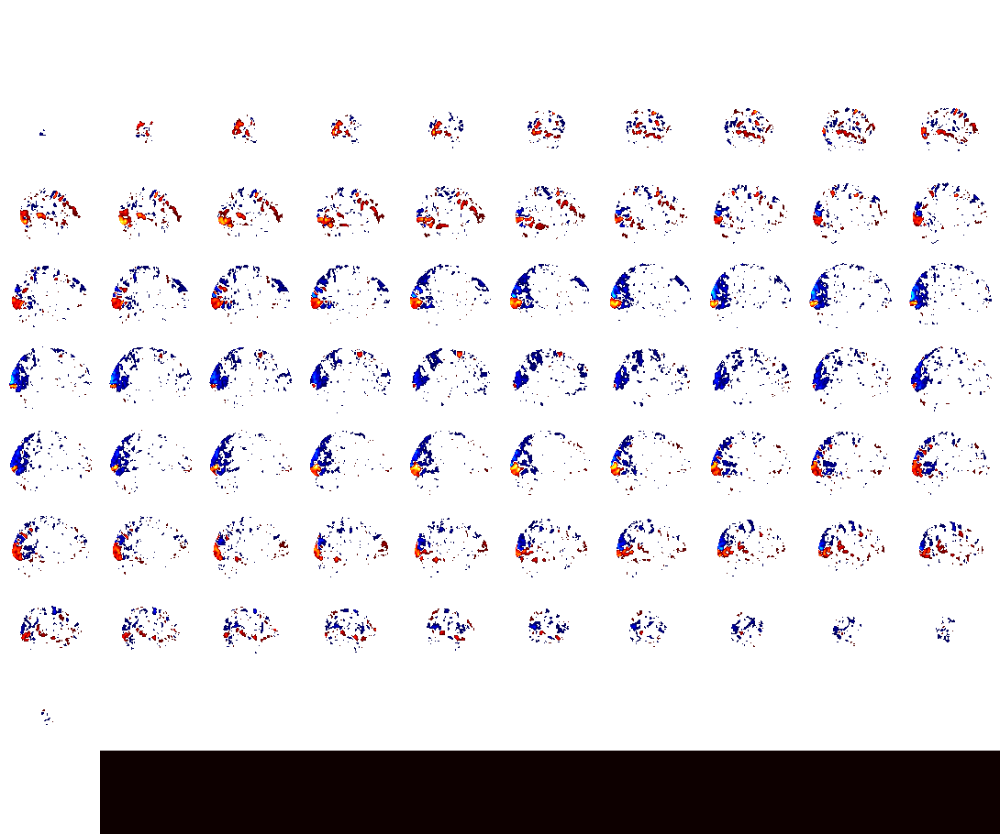

In [29]:
# 950 WPM
plotting.view_img(image.index_img(t_stats_fmri, 3), threshold=2.5)

/home/anukoolpurohit/anaconda3/envs/FSL/lib/python3.9/site-packages/nilearn/_utils/niimg.py:61: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(


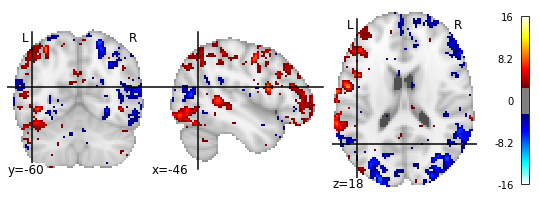

In [30]:
plot_stat_map(image.index_img(t_stats_fmri, 0), threshold=2.5, cut_coords=vwfa_coords)


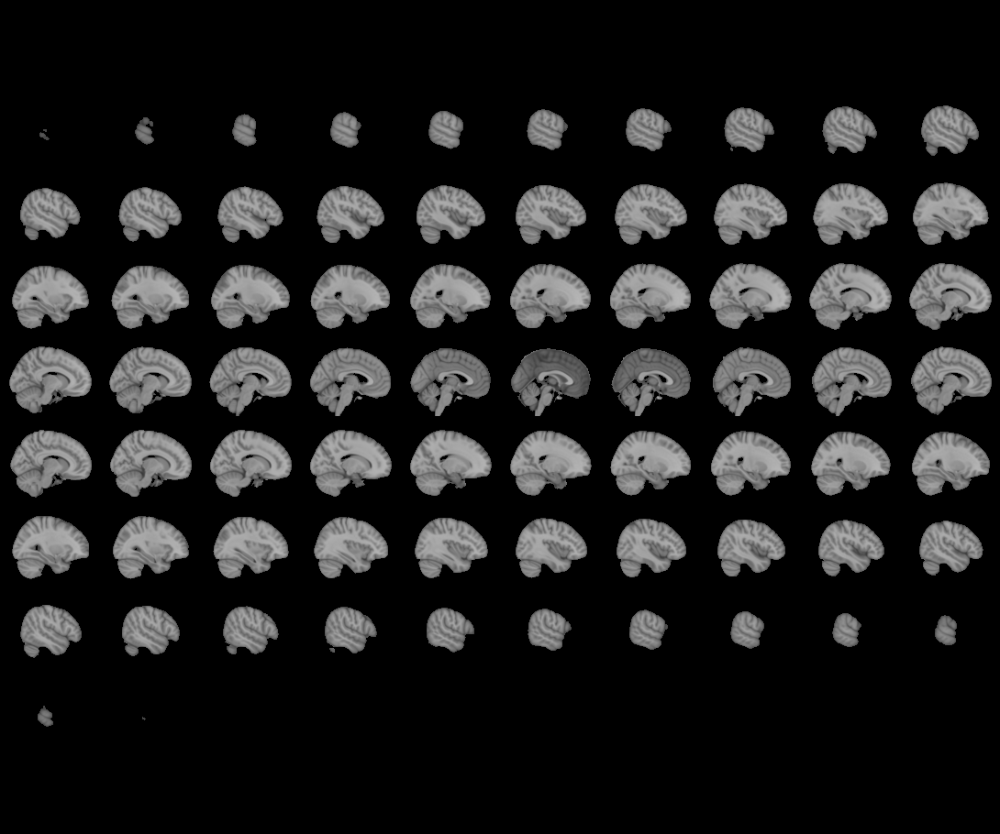
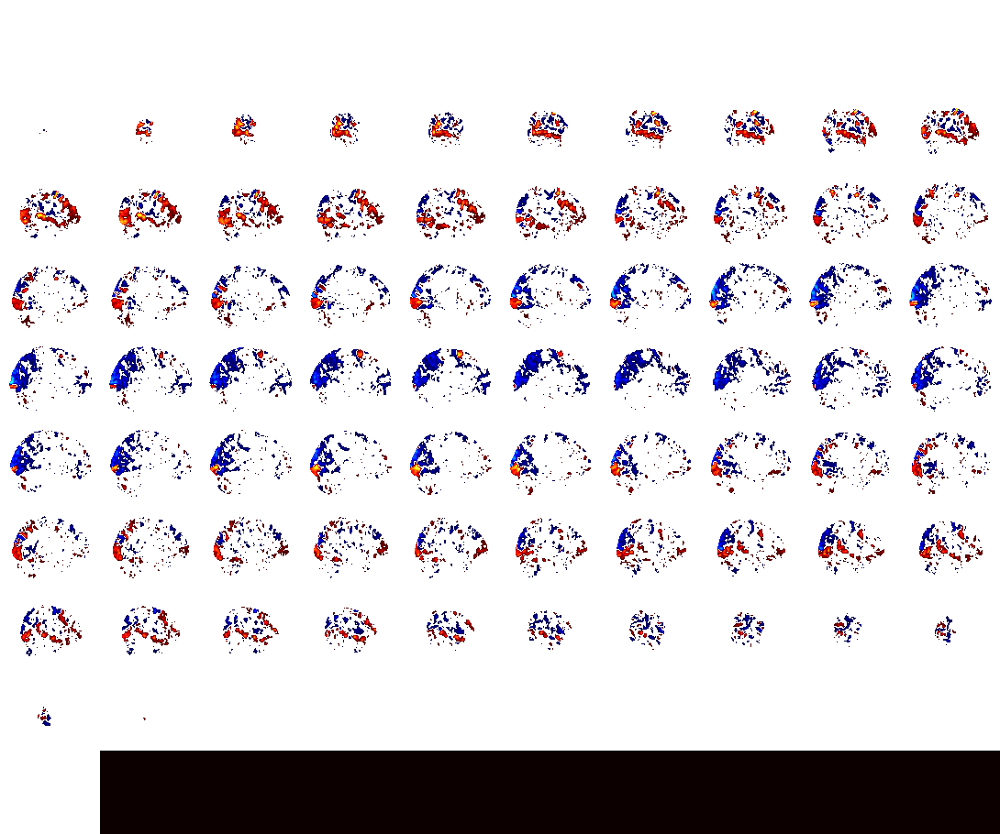

In [31]:
# 1250 WPM
plotting.view_img(image.index_img(t_stats_fmri, 4), threshold=2.5)

## saving figures:

In [32]:
for i, key in enumerate(parametric_stimulus_data.keys()):
    display = plot_stat_map(image.index_img(t_stats_fmri, i),
                            threshold=.5,
                            cut_coords=vwfa_coords)
    display.savefig(f"images/basic_t_scores_{key}.png")
    display.close()

/home/anukoolpurohit/anaconda3/envs/FSL/lib/python3.9/site-packages/nilearn/_utils/niimg.py:61: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(


# Extracting Patterns in T - Stats
Working under the hypothesis that the regions showing some kind of inverted U curves might be where we see a VWFA

In [33]:
target_sequence_inverted_U = np.array([.5, 1 , 5, 1, .5])
target_sequence_inverted_U = target_sequence_inverted_U[None, :]
print(target_sequence_inverted_U.shape)

(1, 5)


In [34]:
beta_Target_seq, t_stat_Target_seq = glm(t_stats[:5], target_sequence_inverted_U.T, mask=mask_glm)

## Plotting the weights and T-stats of the this new Pattern

In [35]:
beta_Target_fmri = masking.unmask(beta_Target_seq, MNI_background_mask)
t_stat_Target_fmri = masking.unmask(t_stat_Target_seq, MNI_background_mask)


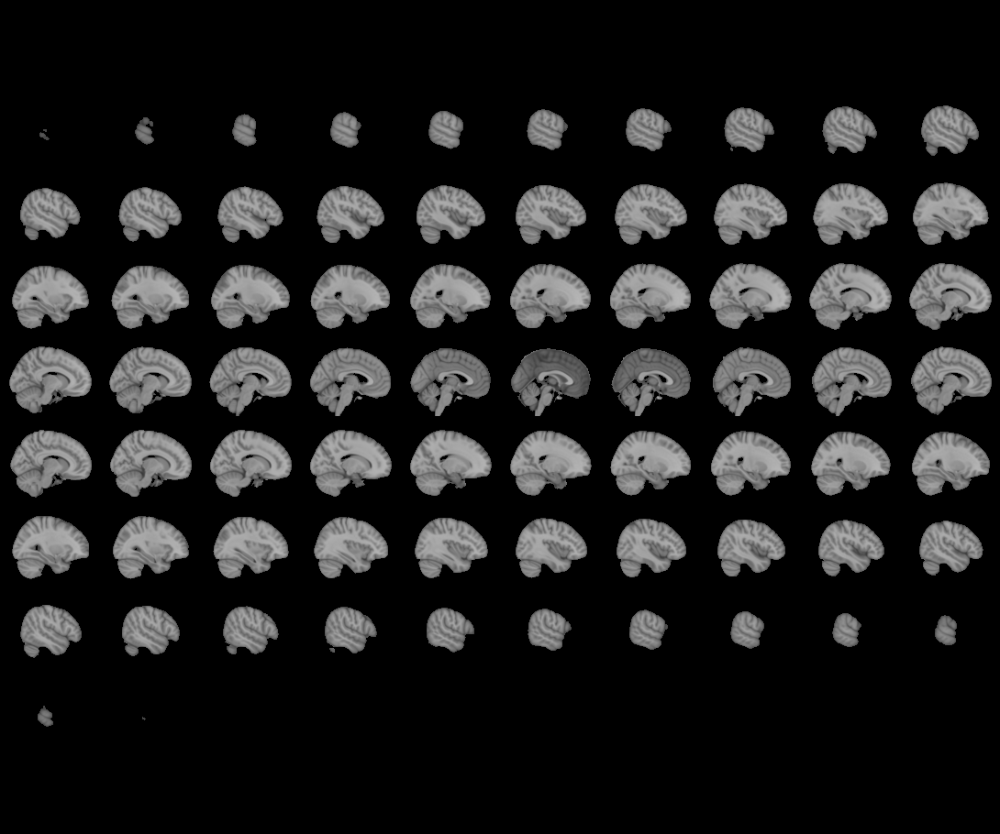
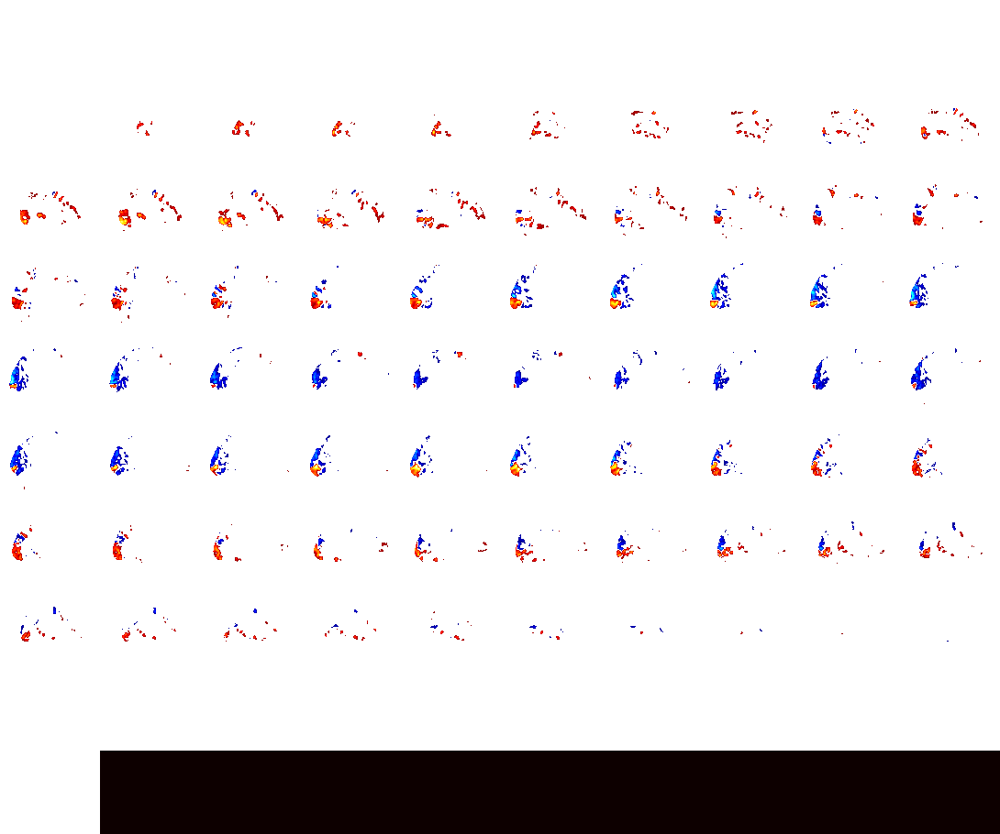

In [36]:
plotting.view_img(beta_Target_fmri, threshold=1.5)

# Harvard-Oxford Atlas

In [37]:
from nilearn.datasets import fetch_atlas_harvard_oxford

In [38]:
havard_oxford_atlas = fetch_atlas_harvard_oxford("cort-prob-2mm")

## Labels

In [39]:
for i, label in enumerate(havard_oxford_atlas.labels):
    print(f"Label {i}: {label}")

Label 0: Background
Label 1: Frontal Pole
Label 2: Insular Cortex
Label 3: Superior Frontal Gyrus
Label 4: Middle Frontal Gyrus
Label 5: Inferior Frontal Gyrus, pars triangularis
Label 6: Inferior Frontal Gyrus, pars opercularis
Label 7: Precentral Gyrus
Label 8: Temporal Pole
Label 9: Superior Temporal Gyrus, anterior division
Label 10: Superior Temporal Gyrus, posterior division
Label 11: Middle Temporal Gyrus, anterior division
Label 12: Middle Temporal Gyrus, posterior division
Label 13: Middle Temporal Gyrus, temporooccipital part
Label 14: Inferior Temporal Gyrus, anterior division
Label 15: Inferior Temporal Gyrus, posterior division
Label 16: Inferior Temporal Gyrus, temporooccipital part
Label 17: Postcentral Gyrus
Label 18: Superior Parietal Lobule
Label 19: Supramarginal Gyrus, anterior division
Label 20: Supramarginal Gyrus, posterior division
Label 21: Angular Gyrus
Label 22: Lateral Occipital Cortex, superior division
Label 23: Lateral Occipital Cortex, inferior division


## Plot atlas

In [40]:
HO_atlas_map = nib.load(havard_oxford_atlas.maps)
print(f"The atlas is of the shape {HO_atlas_map.shape} X x Y x Z x Regions")

The atlas is of the shape (91, 109, 91, 48) X x Y x Z x Regions


/home/anukoolpurohit/anaconda3/envs/FSL/lib/python3.9/site-packages/nilearn/plotting/displays.py:101: UserWarning: No contour levels were found within the data range.
  im = getattr(ax, type)(data_2d.copy(),


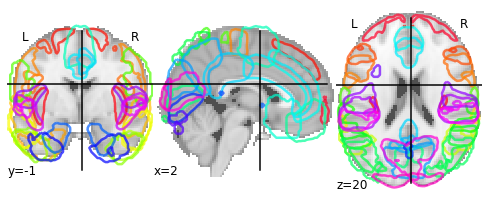

In [41]:
plot_prob_atlas(HO_atlas_map)

/home/anukoolpurohit/anaconda3/envs/FSL/lib/python3.9/site-packages/numpy/ma/core.py:2825: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,


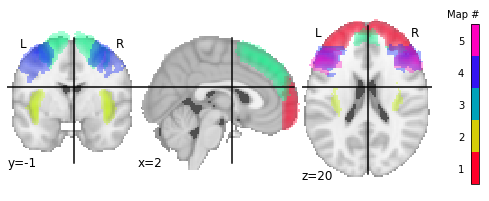

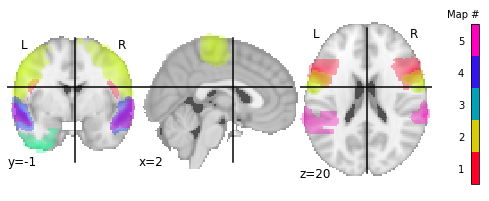

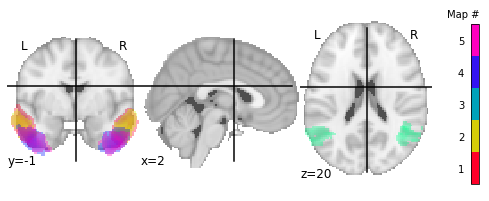

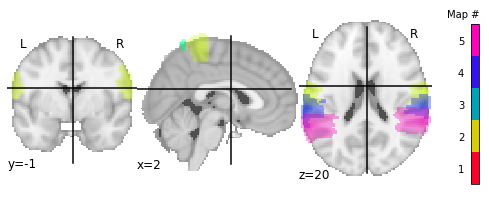

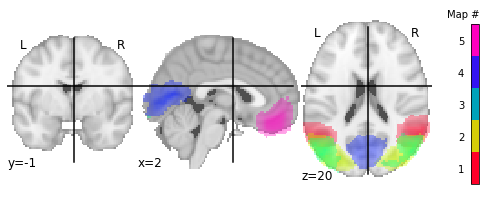

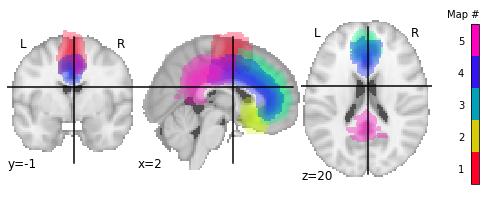

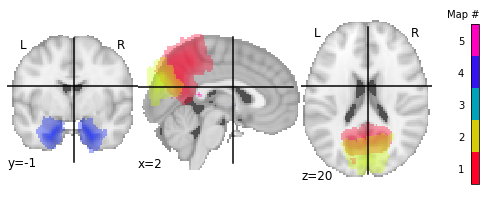

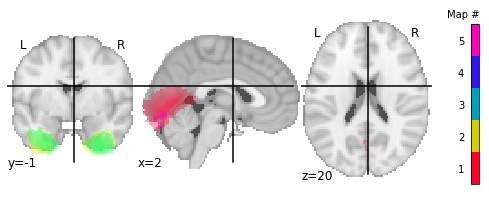

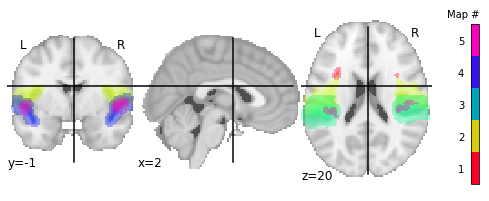

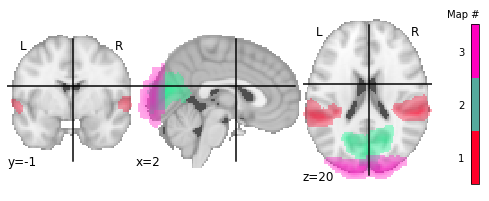

In [42]:
for i in range(0, 48, 5):
    plot_prob_atlas(image.index_img(HO_atlas_map, slice(i, i+5)), colorbar=True, annotate=True)

# Decomposition Experiments

## ICA

In [43]:
from nilearn.decomposition import CanICA, DictLearning

In [44]:
CanICA??

In [45]:
canica = CanICA(n_components=20,
                memory="nilearn_cache", memory_level=2,
                verbose=0,
                mask_strategy='template',
                random_state=0)

In [46]:
canica.fit(beta_fmri)

/home/anukoolpurohit/anaconda3/envs/FSL/lib/python3.9/site-packages/nilearn/image/image.py:1054: FutureWarning: The parameter "sessions" will be removed in 0.9.0 release of Nilearn. Please use the parameter "runs" instead.
  data = signal.clean(


CanICA(mask_strategy='template', memory=Memory(location=nilearn_cache/joblib),
       memory_level=2, random_state=0)

In [47]:
canica_components_img = canica.components_img_

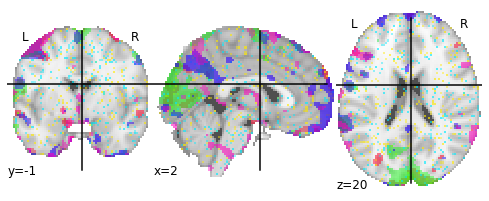

In [48]:
plot_prob_atlas(canica_components_img)

In [49]:
display = plot_prob_atlas(canica_components_img)
display.savefig("images/ICA_prob_atlas.png")
display.close()

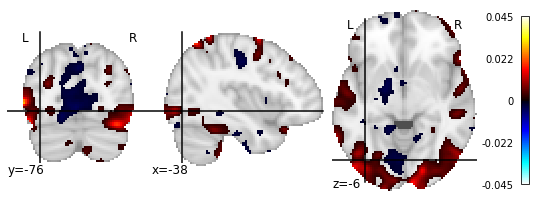

In [50]:
 plot_stat_map(image.index_img(canica_components_img, 0),
                        cut_coords=(-38, -76, -6))

In [51]:
display = plot_stat_map(image.index_img(canica_components_img, 0),
                        cut_coords=(-38, -76, -6))
display.savefig("images/ICA.png")
display.close()


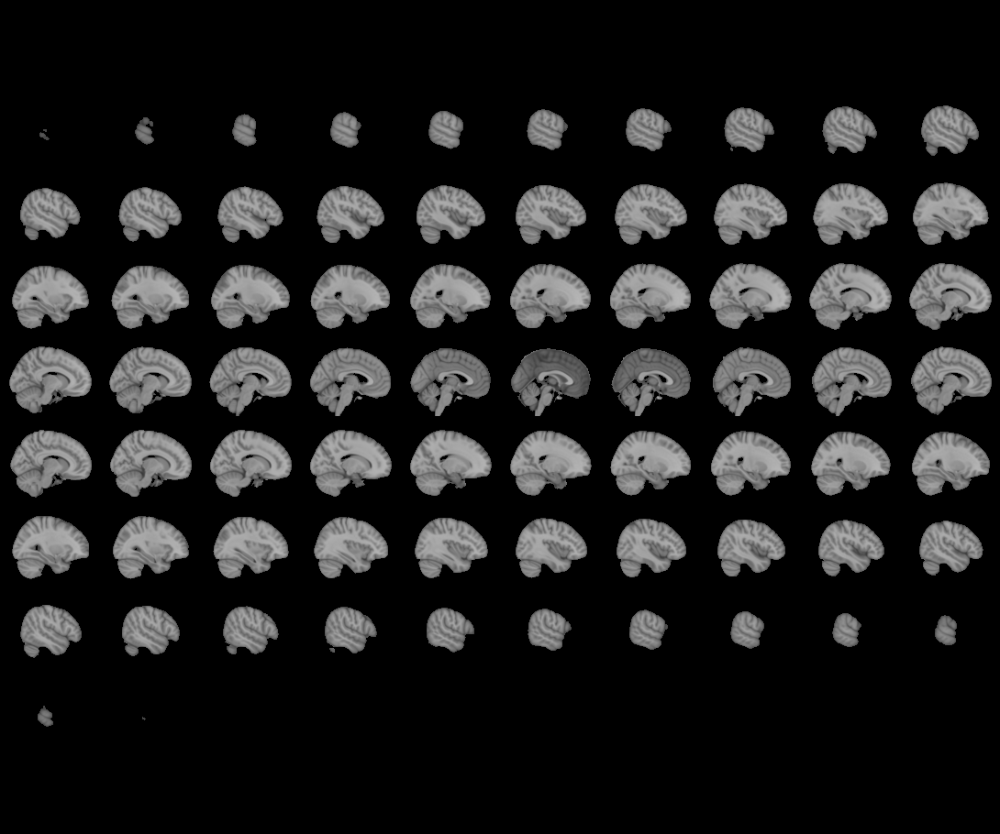
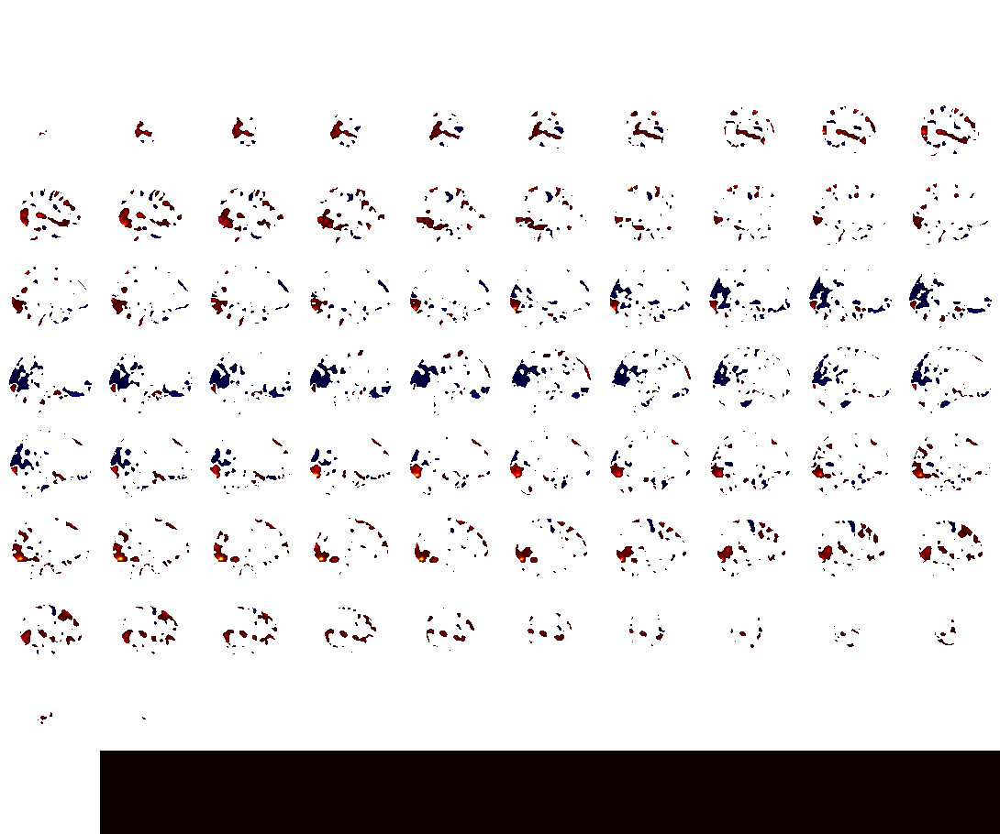

In [52]:
plotting.view_img(image.index_img(canica_components_img, 0))

## Fun with masking

In [53]:
def convert_to_mask(fmri_image, threshold=0):
    data = fmri_image.dataobj
    mask_data = data > threshold
    mask_img = image.new_img_like(fmri_image, mask_data)
    return data, mask_img

In [54]:
def and_masks(mask_list: list):
    mask_prod = mask_list[0].dataobj
    for mask in mask_list:
        mask_prod = mask_prod * mask.dataobj
    return image.new_img_like(mask_list[0], mask_prod)

In [55]:
first_component = image.index_img(canica_components_img, 0)

In [56]:
regions_of_importance = [20, 5, 15, 18, 21]

In [57]:
important_region_in_atlas = image.concat_imgs([image.index_img(HO_atlas_map, i) for i in regions_of_importance])


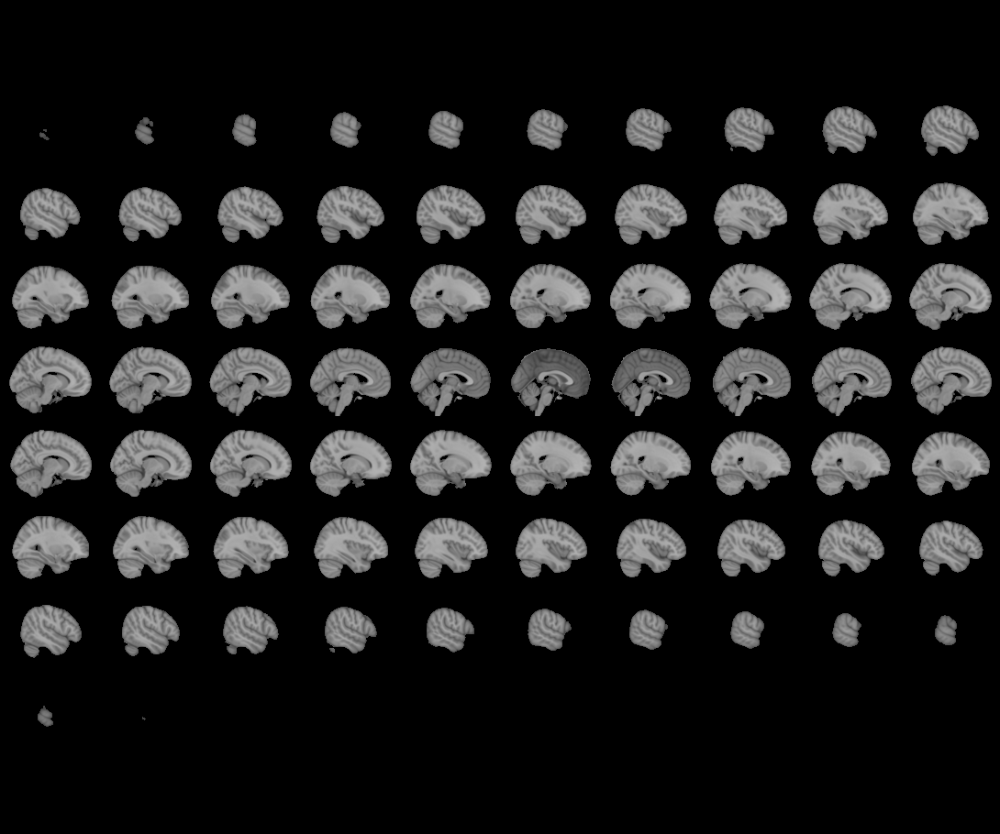
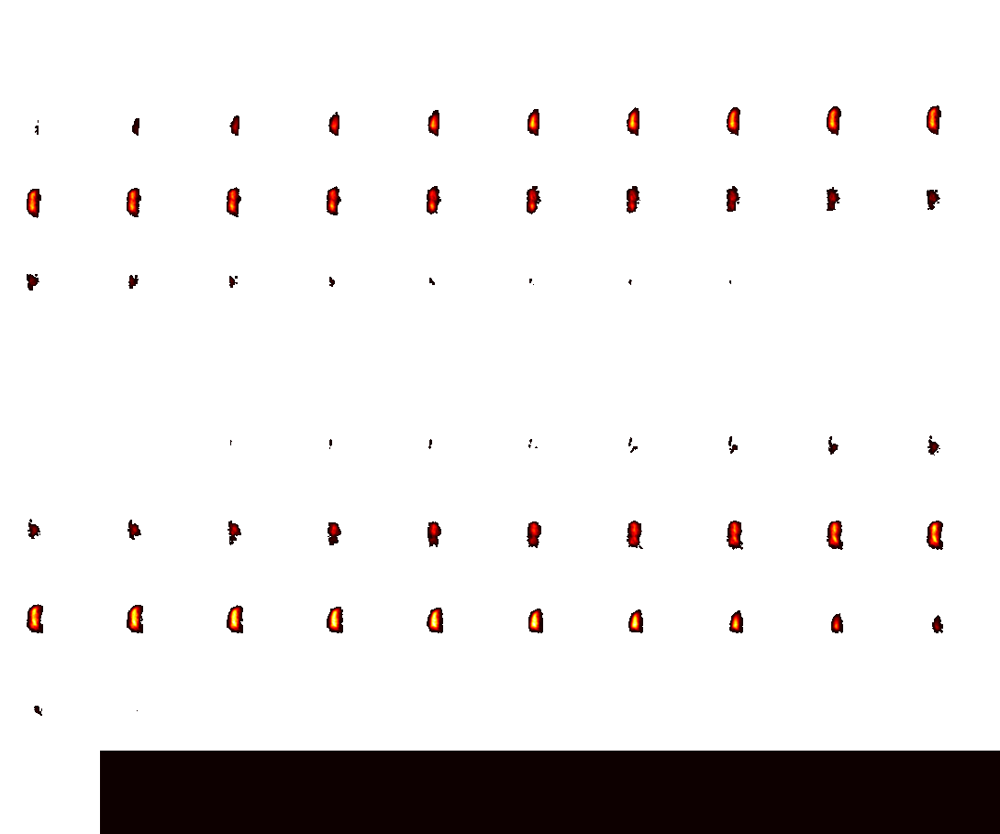

In [58]:
plotting.view_img(image.index_img(important_region_in_atlas, 0))

/home/anukoolpurohit/anaconda3/envs/FSL/lib/python3.9/site-packages/numpy/ma/core.py:2825: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,


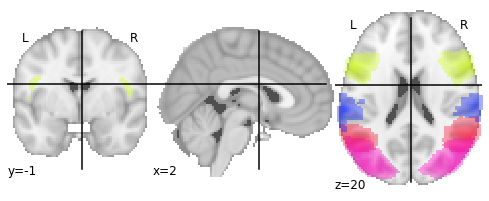

In [59]:
plot_prob_atlas(important_region_in_atlas)

In [60]:
display = plot_prob_atlas(important_region_in_atlas)
display.savefig("images/IT_high_regions.png")
display.close()

In [61]:
_,first_component_mask = convert_to_mask(first_component)
new_atlas_maps = []
for region in regions_of_importance:
    fmri_atlas_region = image.index_img(HO_atlas_map, region)
    _,fmri_atlas_map = convert_to_mask(fmri_atlas_region)
    combination_mask = and_masks([fmri_atlas_map, first_component_mask])
    new_atlas_maps.append(combination_mask)
new_atlas_maps = image.concat_imgs(new_atlas_maps)

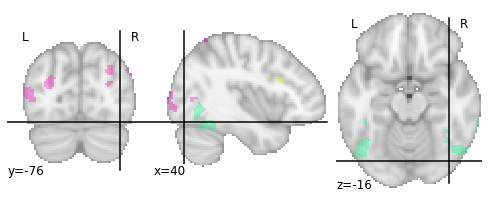

In [62]:
plot_prob_atlas(new_atlas_maps, cut_coords=(40, -76, -16))

In [63]:
display = plot_prob_atlas(new_atlas_maps, cut_coords=(40, -76, -16))
display.savefig("images/combination_regions.png")
display.close()

/home/anukoolpurohit/anaconda3/envs/FSL/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn("Resampling binary images with continuous or "



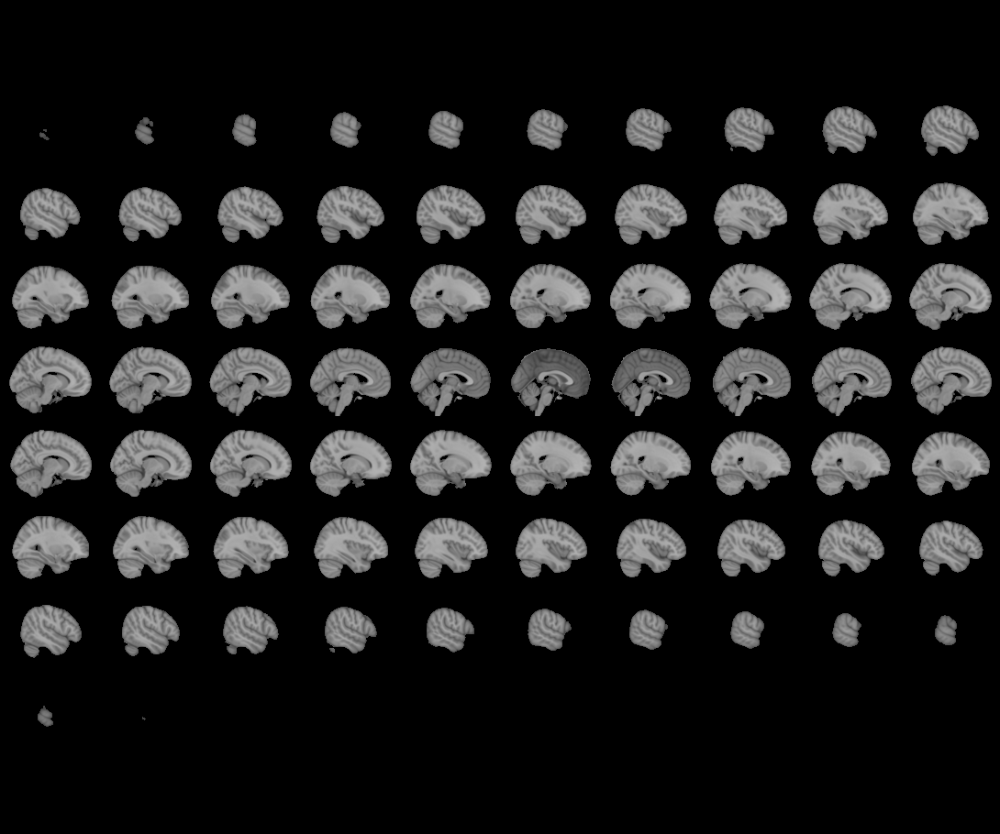
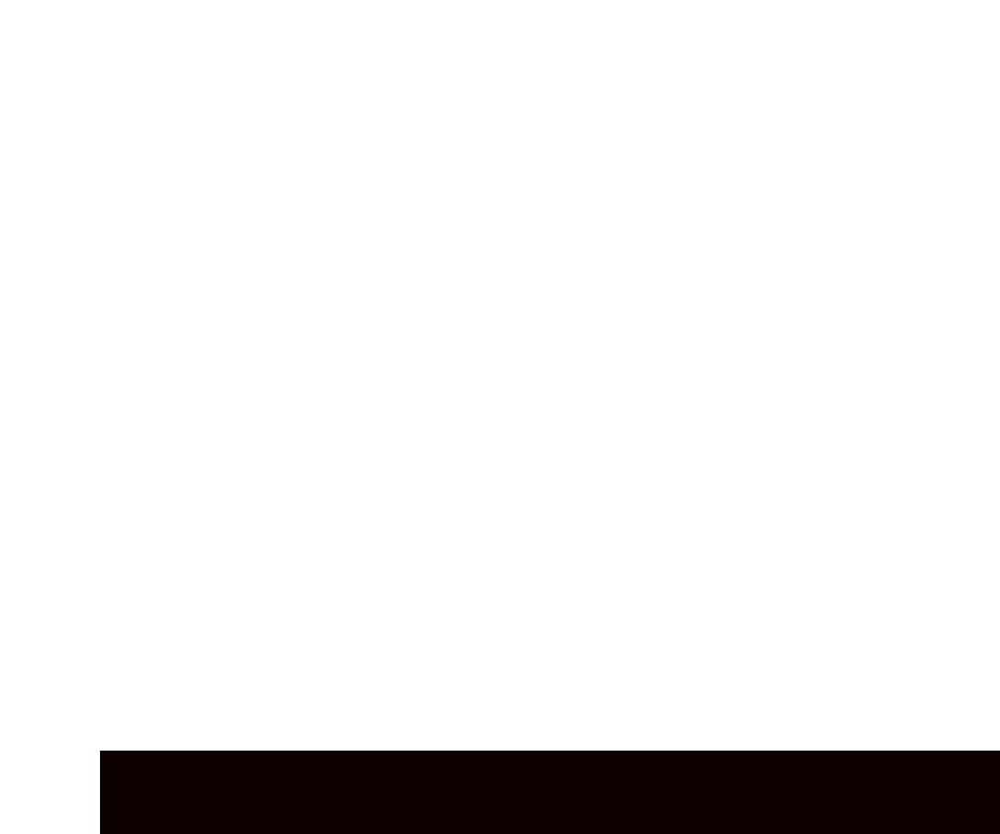

In [64]:
plotting.view_img(image.index_img(new_atlas_maps, 4))

# Looking at T-stats in different regions

In [65]:
t_stats_fmri.shape

(91, 109, 91, 6)

In [66]:
from nilearn.input_data import NiftiMapsMasker

In [67]:
masker = NiftiMapsMasker(new_atlas_maps)

In [68]:
mean_t_stats_imp_regions = masker.fit_transform(t_stats_fmri)

/home/anukoolpurohit/anaconda3/envs/FSL/lib/python3.9/site-packages/nilearn/image/image.py:1054: FutureWarning: The parameter "sessions" will be removed in 0.9.0 release of Nilearn. Please use the parameter "runs" instead.
  data = signal.clean(
/home/anukoolpurohit/anaconda3/envs/FSL/lib/python3.9/site-packages/nilearn/_utils/niimg.py:61: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(


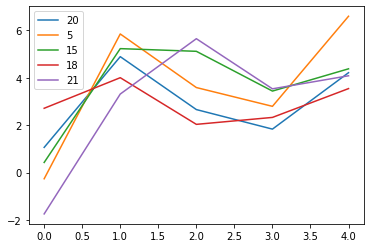

In [69]:
plt.plot(mean_t_stats_imp_regions[:5])
plt.legend(regions_of_importance)

# connected region analysis of the polynomials in t-stats

In [70]:
new_connected_atlas, labels = nilearn.regions.connected_regions(new_atlas_maps)

In [71]:
new_connected_atlas.shape

(91, 109, 91, 11)

In [72]:
print(labels, len(labels))

[0, 0, 0, 1, 1, 2, 2, 4, 4, 4, 4] 11


/home/anukoolpurohit/anaconda3/envs/FSL/lib/python3.9/site-packages/nilearn/image/resampling.py:273: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn("Resampling binary images with continuous or "
/home/anukoolpurohit/anaconda3/envs/FSL/lib/python3.9/site-packages/nilearn/plotting/html_document.py:56: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



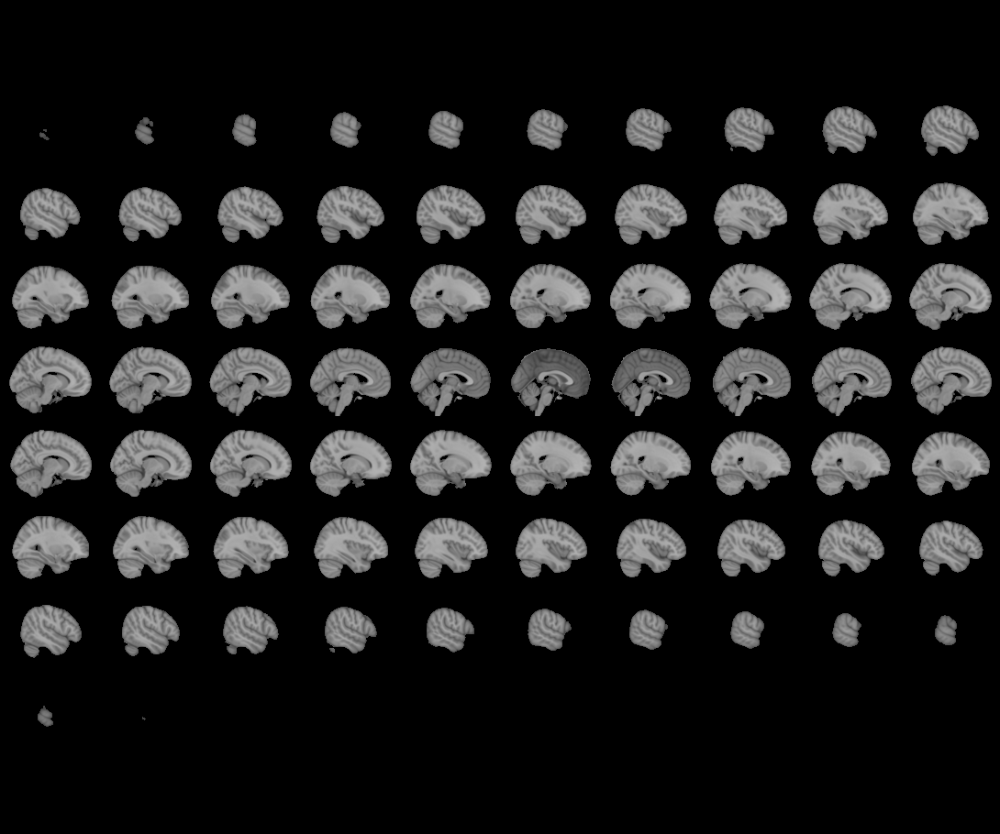
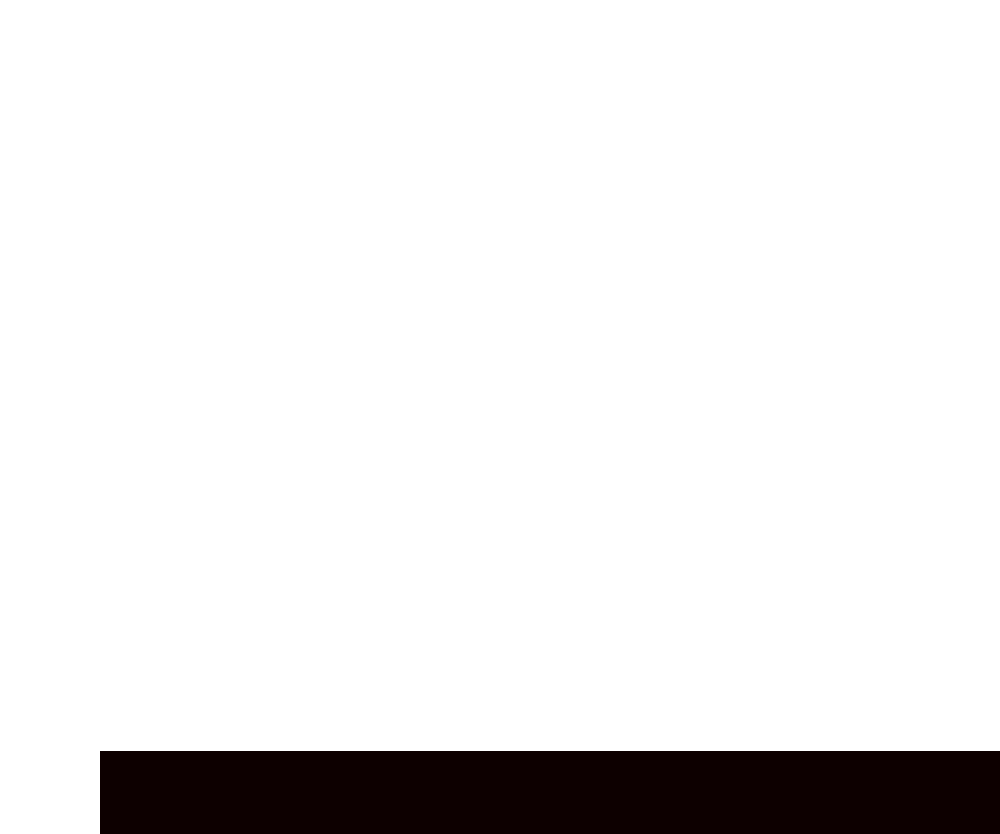

In [74]:
plotting.view_img(image.index_img(new_connected_atlas, 6))

In [78]:
display = plotting.plot_stat_map(image.index_img(new_connected_atlas, 6), cut_coords=(-44, -62, -14))
display.savefig("images/connected_regions_mask_example.png")
display.close()

In [76]:
connected_masker = NiftiMapsMasker(new_connected_atlas)
mean_t_stats_connected_regions = connected_masker.fit_transform(t_stats_fmri)

/home/anukoolpurohit/anaconda3/envs/FSL/lib/python3.9/site-packages/nilearn/image/image.py:1054: FutureWarning: The parameter "sessions" will be removed in 0.9.0 release of Nilearn. Please use the parameter "runs" instead.
  data = signal.clean(


In [117]:
words_per_min = np.array([50, 350, 650, 950, 1250])

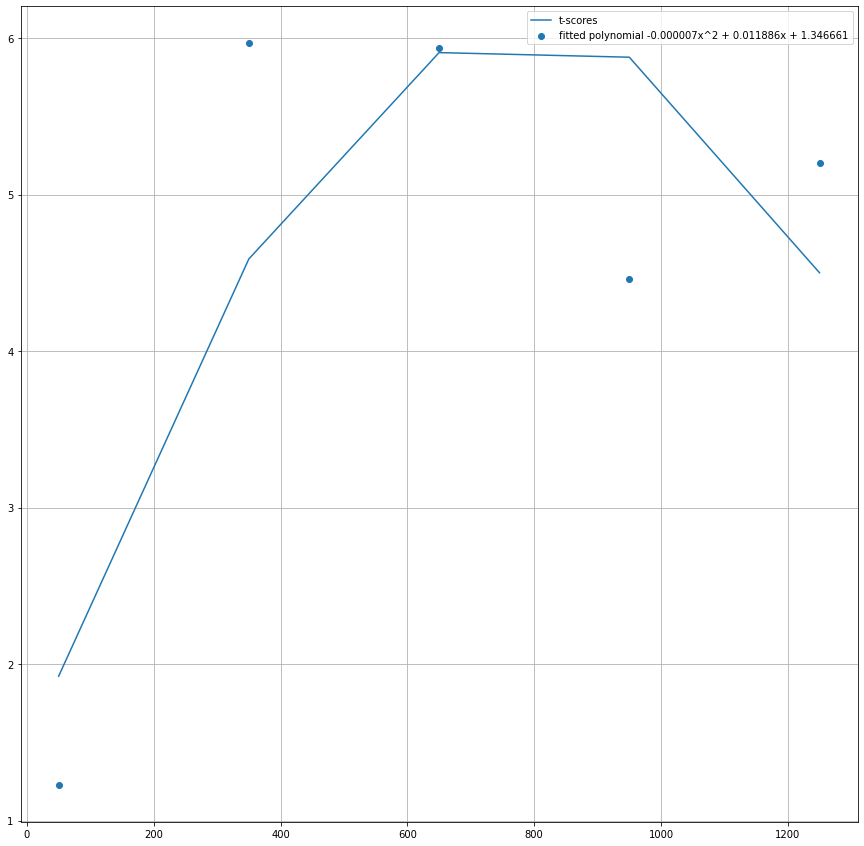

In [144]:
plt.figure(figsize=(15, 15))
plt.scatter(words_per_min, mean_t_stats_connected_regions[:5, 6])
coeffs = np.polyfit(x=words_per_min, y=mean_t_stats_connected_regions[:5, 6], deg=2)
poly_line = get_polynomial(coeffs, words_per_min)
plt.plot(words_per_min, poly_line)
plt.legend(["t-scores", poly_name])
plt.grid()
plt.savefig("images/Inverted_U_VWFA.png")
plt.show()

In [142]:
 poly_name = f"fitted polynomial {coeffs[0]:2f}x^2 +" + f" {coeffs[1]:2f}x +" + f" {coeffs[2]:2f}"

In [122]:
["t-scores", f"fitted polynomial {coeffs[0]}*x^2 +{coeffs{1}}*x + {coeffs[2]}"]

SyntaxError: f-string: invalid syntax (355259055.py, line 1)

# Analyzing the polynomials in T-stats

In [80]:
from tqdm import tqdm

In [81]:
words_per_min = np.array([50, 350, 650, 950, 1250])

In [82]:
def get_polynomials_from_stats(t_stat, x,  degree=2):
    t_fmri_wpms = t_stat[:5]
    words_per_min = x
    words_per_min = words_per_min / 100

    polynomial_fmri = []
    for i in tqdm(range(t_fmri_wpms.shape[1]), leave=False):
        poly_coefs = np.polyfit(words_per_min, t_fmri_wpms[:, i], degree)
        polynomial_fmri.append(poly_coefs)
    polynomial_fmri = np.array(polynomial_fmri)
    polynomial_fmri = polynomial_fmri.T
    polynomial_fmri = np.nan_to_num(polynomial_fmri, 0)
    return polynomial_fmri

In [83]:
t_stats.shape

(6, 229007)

In [84]:
polynomial_of_t_stat = get_polynomials_from_stats(t_stats, words_per_min)

In [85]:
polynomial_of_t_stat.shape

(3, 229007)

In [86]:
polymoial_of_t_stat_as_fmri = masking.unmask(polynomial_of_t_stat, MNI_background_mask)

In [87]:
polymoial_of_t_stat_as_fmri.shape

(91, 109, 91, 3)

/home/anukoolpurohit/anaconda3/envs/FSL/lib/python3.9/site-packages/nilearn/plotting/html_document.py:56: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



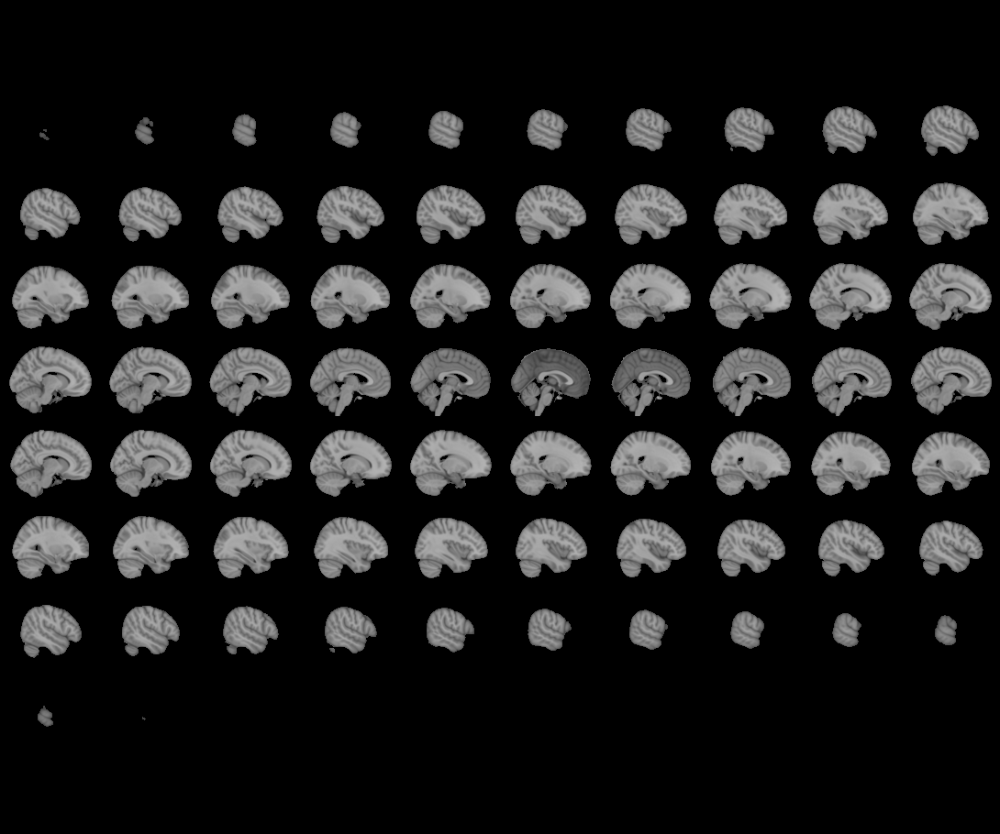
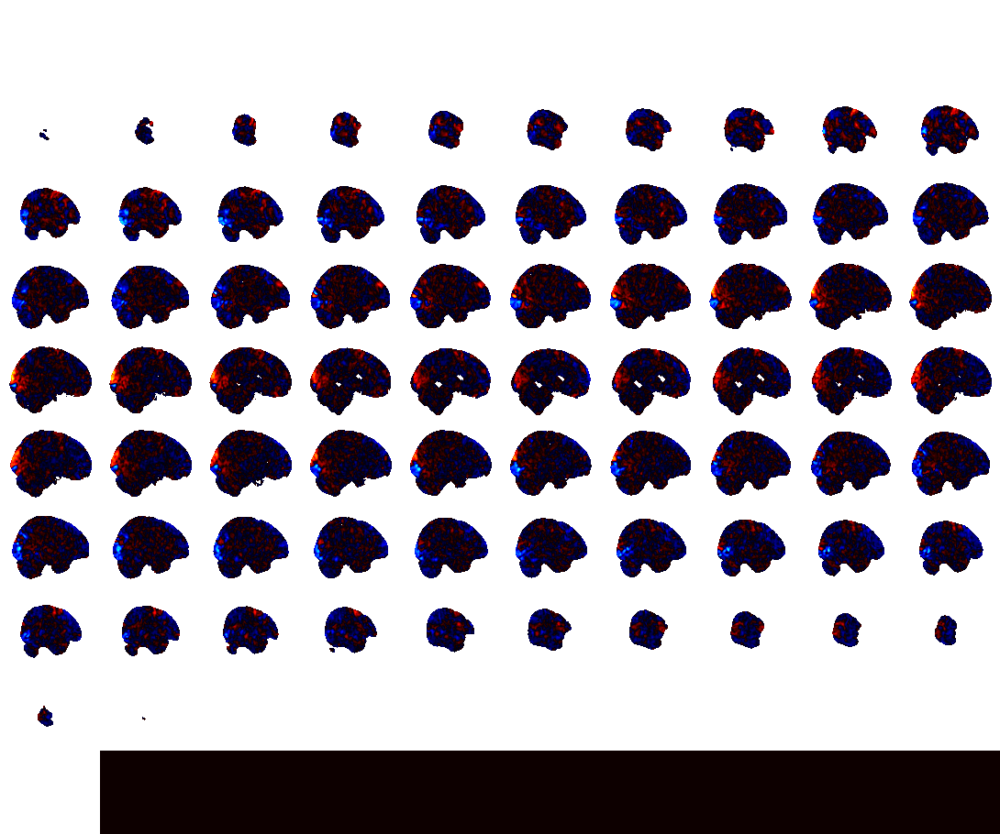

In [88]:
# X^2
plotting.view_img(image.index_img(polymoial_of_t_stat_as_fmri, 0), cut_coords=vwfa_coords)

/home/anukoolpurohit/anaconda3/envs/FSL/lib/python3.9/site-packages/nilearn/plotting/html_document.py:56: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



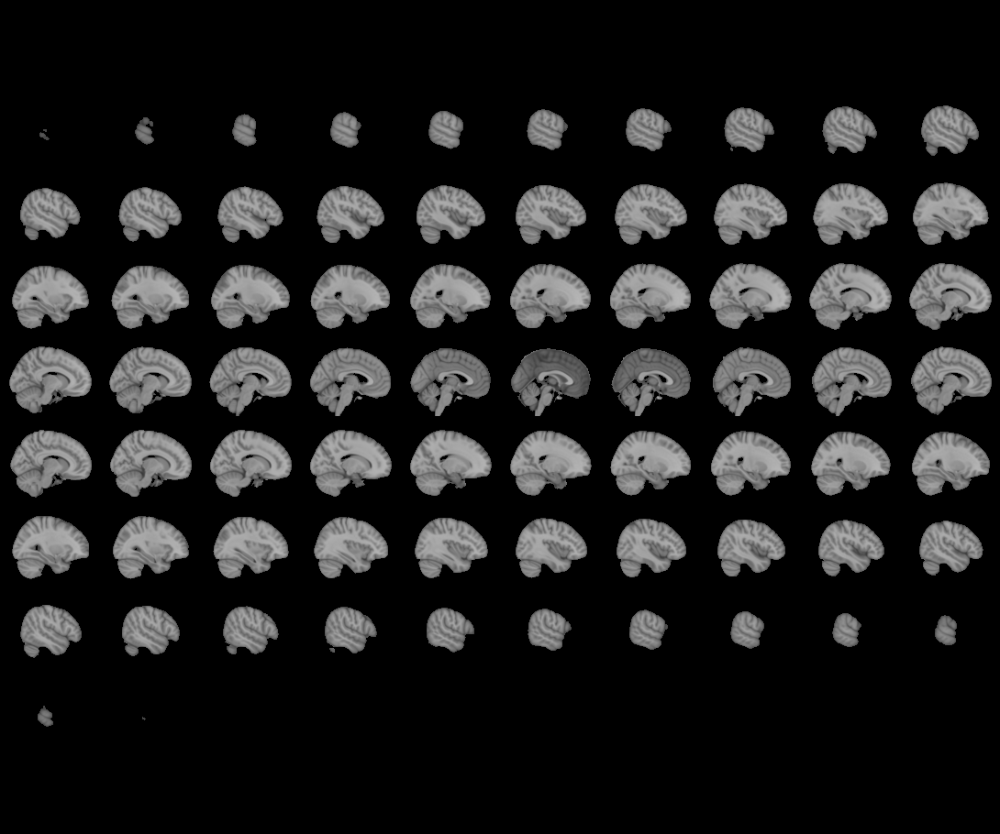
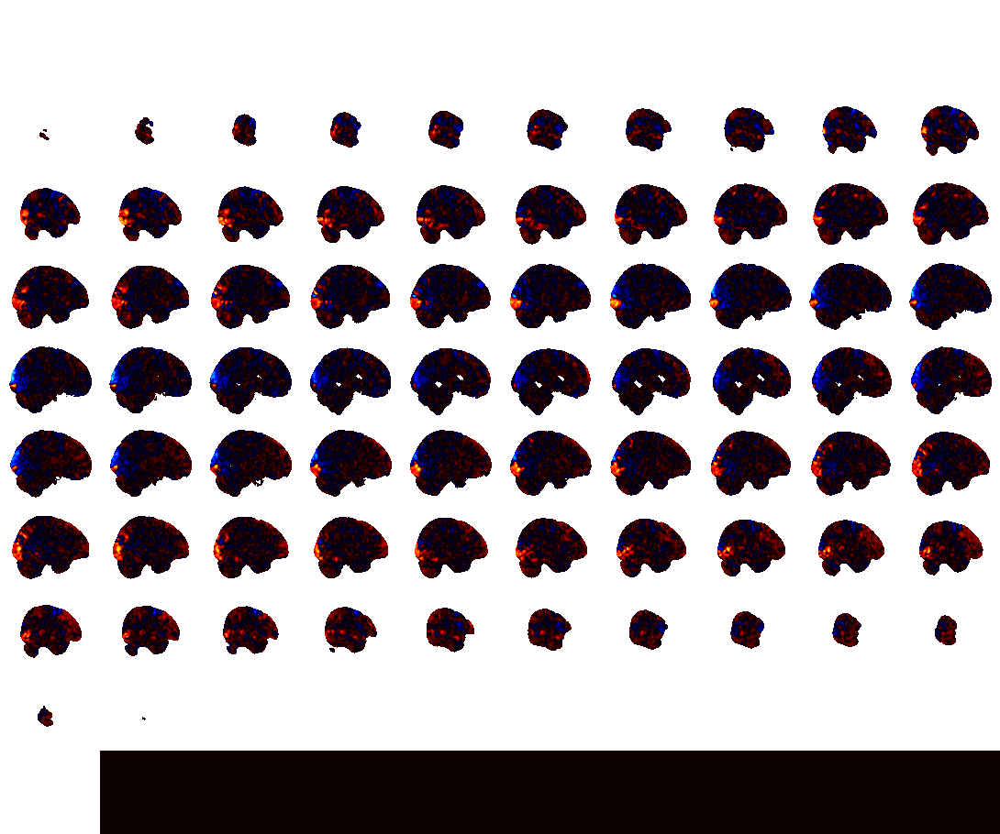

In [89]:
plotting.view_img(image.index_img(polymoial_of_t_stat_as_fmri, 1), )

/home/anukoolpurohit/anaconda3/envs/FSL/lib/python3.9/site-packages/nilearn/plotting/html_document.py:56: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



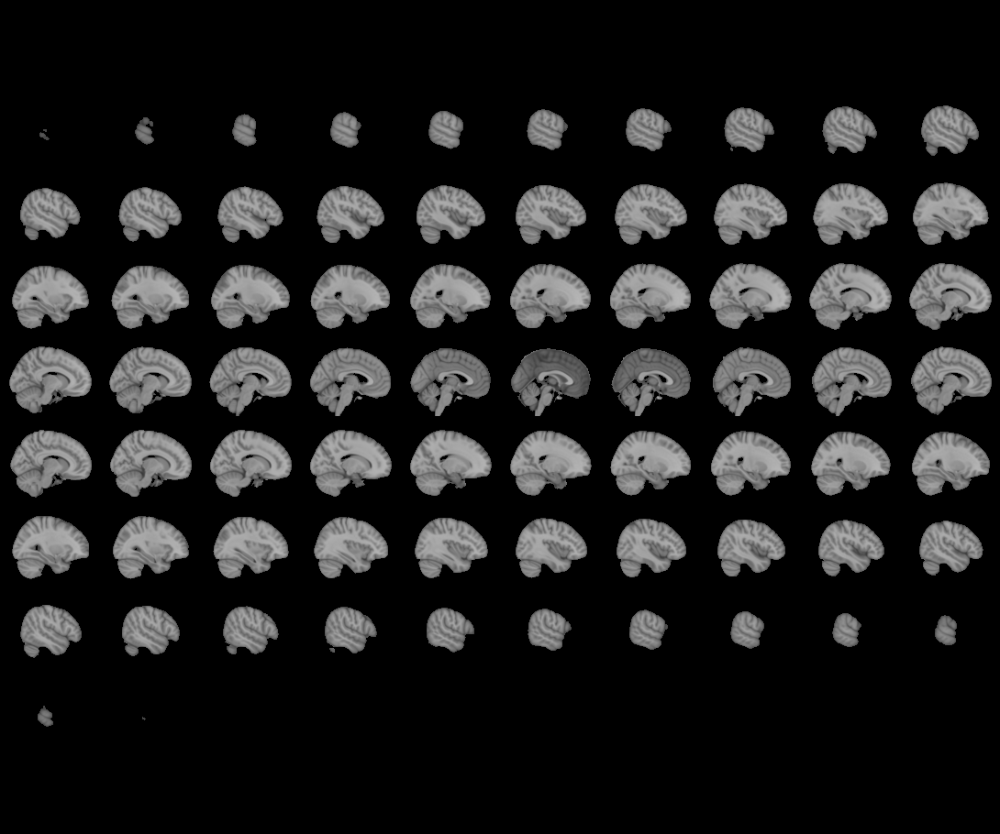
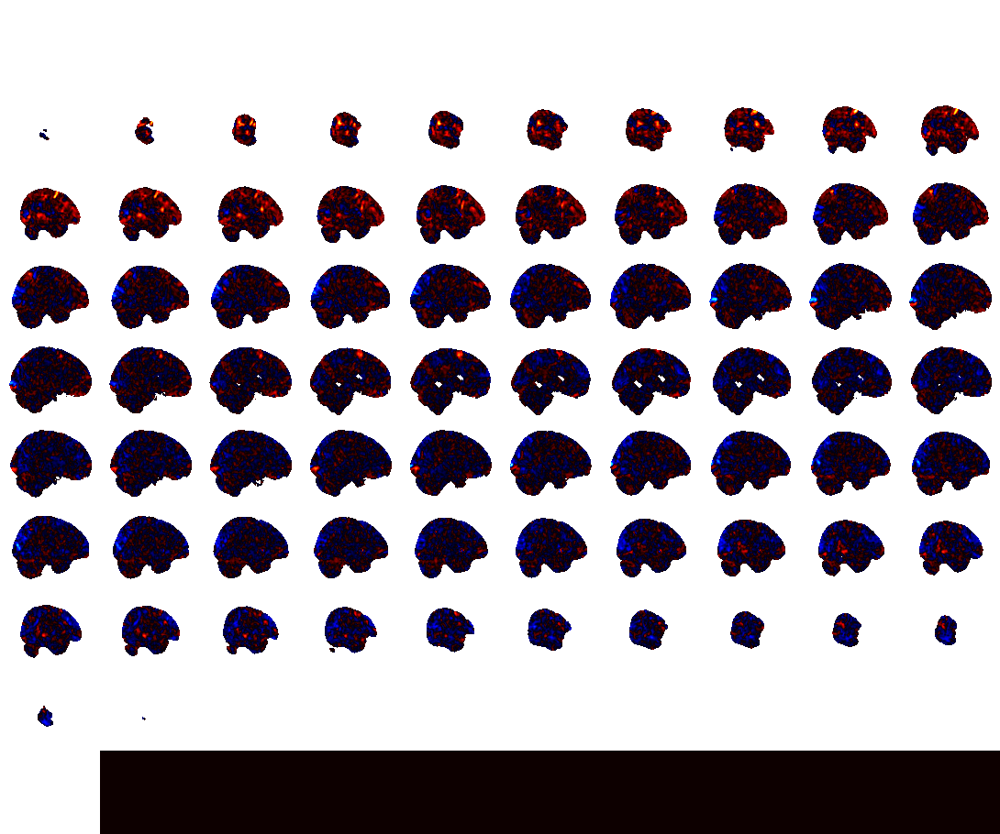

In [90]:
plotting.view_img(image.index_img(polymoial_of_t_stat_as_fmri, 2))

## saving figures

In [91]:
vwfa_coords

(-46, -60, 18)

In [149]:
threshold = [.05, 1, 2]

In [150]:
for i in range(3):
    display = plot_stat_map(image.index_img(polymoial_of_t_stat_as_fmri, i),
                            cut_coords=(-44, -56, -18), threshold=threshold[i])
    display.savefig(f"images/{i+1}order_coefficent_fmri.png")
    display.close()

## PCA of Polynomials

In [93]:
from sklearn.decomposition import PCA

In [94]:
pca = PCA(n_components= 3)

In [95]:
polynomial_of_t_stat = np.nan_to_num(polynomial_of_t_stat, 0)

In [96]:
pca.fit(polynomial_of_t_stat.T)

PCA(n_components=3)

In [97]:
poly_components = pca.components_

In [98]:
def get_polynomial(coeffs, x):
    return coeffs @np.array([x**2, x, np.ones_like(x)])

In [99]:
words_per_min = np.array([50, 350, 650, 950, 1250])
words_per_min = words_per_min / 100

In [100]:
component_polynomials = [get_polynomial(poly_components[i], words_per_min) for i in range(3)]

In [101]:
len(component_polynomials)

3

In [102]:
def plot_polynomials(component_polynomials, x, name="sample.png"):
    fig, ax = plt.subplots(3, 1, figsize=(15,15))
    ax[0].plot(x,component_polynomials[0], 'r')
    ax[0].plot(x, component_polynomials[1], 'g')
    ax[0].plot(x, component_polynomials[2], 'b')

    ax[1].plot(x, component_polynomials[0], 'r')
    ax[1].plot(x, component_polynomials[1], 'g')

    ax[2].plot(x, component_polynomials[0], 'r')
    plt.savefig(name)
    plt.show()
    return

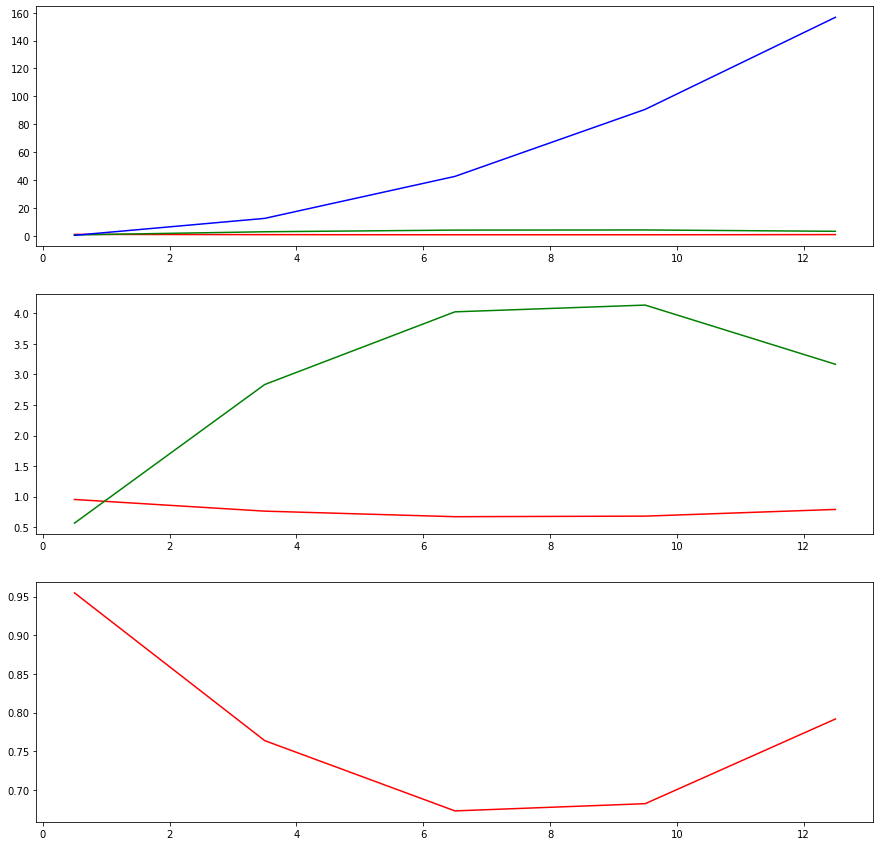

In [103]:
plot_polynomials(component_polynomials, words_per_min, "images/general_polynomial_components.png")

# Region specific polynomial analysis

In [104]:
def get_polynomials_mask(fmri, mask, x):
    fmri_voxels_in_mask = masking.apply_mask(fmri, mask)
    polynomials_in_fmri_voxels = get_polynomials_from_stats(fmri_voxels_in_mask, x)
    pca = PCA(n_components=3)
    pca.fit(polynomials_in_fmri_voxels.T)
    polynomials = get_polynomial(pca.components_, x)
    return polynomials

In [105]:
words_per_min = np.array([50, 350, 650, 950, 1250])
words_per_min = words_per_min / 1000

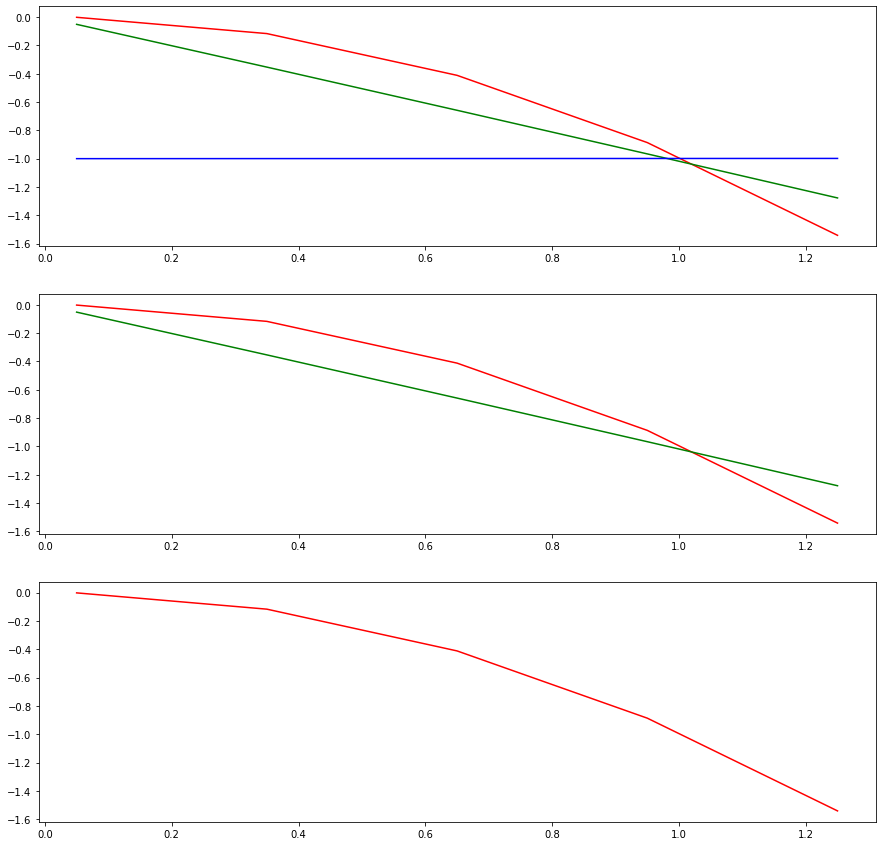

In [106]:
plot_polynomials(get_polynomials_mask(t_stats_fmri,
                                      image.index_img(new_connected_atlas, 6),
                                      words_per_min), words_per_min, "images/VWFA_polynomial_components.png")